# <img style="float: left; padding-right: 10px; width: 45px" src="https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/iacs.png"> CS109B Introduction to Data Science

## Lab 7:  SOTA, Transfer Learning, and Visualizing CNNs

**Harvard University**<br/>
**Spring 2025**<br/>
**Instructors**: Pavlos Protopapas, Natesh Pillai, and Chris Gumb<br/>
<br/>

In [1]:
# Importing the necessary libraries
import os
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
from tensorflow import keras
from tensorflow.keras.datasets import mnist
from tensorflow.keras import layers
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, AveragePooling2D, GlobalAvgPool2D, Dense, Add, Flatten, Dropout, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.activations import relu
from tensorflow.keras import Input
from tensorflow.keras.models import Model
from IPython.display import Image, display

# shush warnings
import logging
import tensorflow as tf

# Set logging level to only show errors
logging.getLogger("tensorflow").setLevel(logging.ERROR)

# Filter out warnings related to while_loop conversions
tf.get_logger().setLevel("ERROR")

## State-of-the-art (SOTA) models

### PREPARE DATASET

#### Load Data
We will use the MNIST dataset as an example.

In [2]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()

print('x_train: ' + str(x_train.shape))
print('y_train: ' + str(y_train.shape))
print('x_test: ' + str(x_test.shape))
print('y_test: ' + str(y_test.shape))

x_train: (60000, 28, 28)
y_train: (60000,)
x_test: (10000, 28, 28)
y_test: (10000,)


#### Preprocess the Data

In [3]:
# Preprocessing the data
x_train = x_train.reshape(-1,28,28,1).astype('float32')/255.
x_test = x_test.reshape(-1,28,28,1).astype('float32')/255.
y_train = y_train.astype('int32')
y_test = y_test.astype('int32')

In [4]:
# Train/validation split (80:20)
val_idx = np.random.choice(a = x_train.shape[0], size = int(x_train.shape[0]*0.2), replace=False)

# Select validation dataset
x_val = x_train[val_idx]
y_val = y_train[val_idx]
print("Size of Validation dataset: " + str(x_val.shape))

# Exclude the validation dataset from the train dataset
train_idx = np.arange(0,60000)
idx_to_pick = np.isin(train_idx, val_idx) # Finding whether "val_idx" are present or not in "train_idx"
train_idx_new = ~idx_to_pick # Invert "True" or "False"
x_train = x_train[train_idx_new]
y_train = y_train[train_idx_new]
print("Size of Train dataset: " + str(x_train.shape))

Size of Validation dataset: (12000, 28, 28, 1)
Size of Train dataset: (48000, 28, 28, 1)


#### View Example Observations

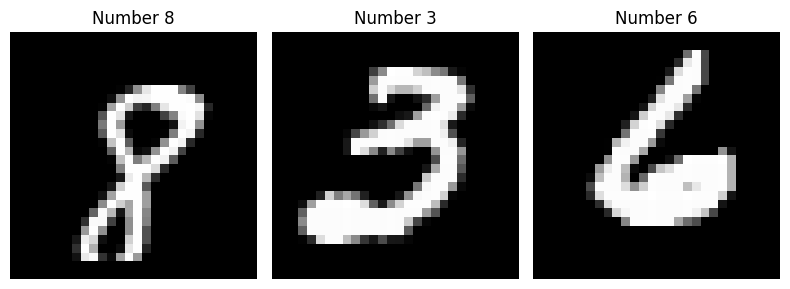

In [5]:
# Taking a look at the data
columns = 3
rows = 1
fig = plt.figure(figsize=(8, 8))

for i in range(1, columns * rows+1):
    data_idx = np.random.randint(len(x_train))
    img = x_train[data_idx].reshape([28, 28])
    label = y_train[data_idx]

    fig.add_subplot(rows, columns, i)
    plt.title("Number "+str(label))
    plt.imshow(img, cmap='gray')
    plt.axis('off')
plt.tight_layout()
plt.show()

#### Convert to Tensorflow Dataset objects

In [6]:
# Converting into tensorflow dataset
batch_size = 32
traingen = tf.data.Dataset.from_tensor_slices((x_train, y_train)).batch(batch_size)
valgen = tf.data.Dataset.from_tensor_slices((x_val, y_val)).batch(batch_size)
testgen = tf.data.Dataset.from_tensor_slices((x_test, y_test)).batch(batch_size)

## Let's talk about SOTA models!

##Brief overview of Inception Network

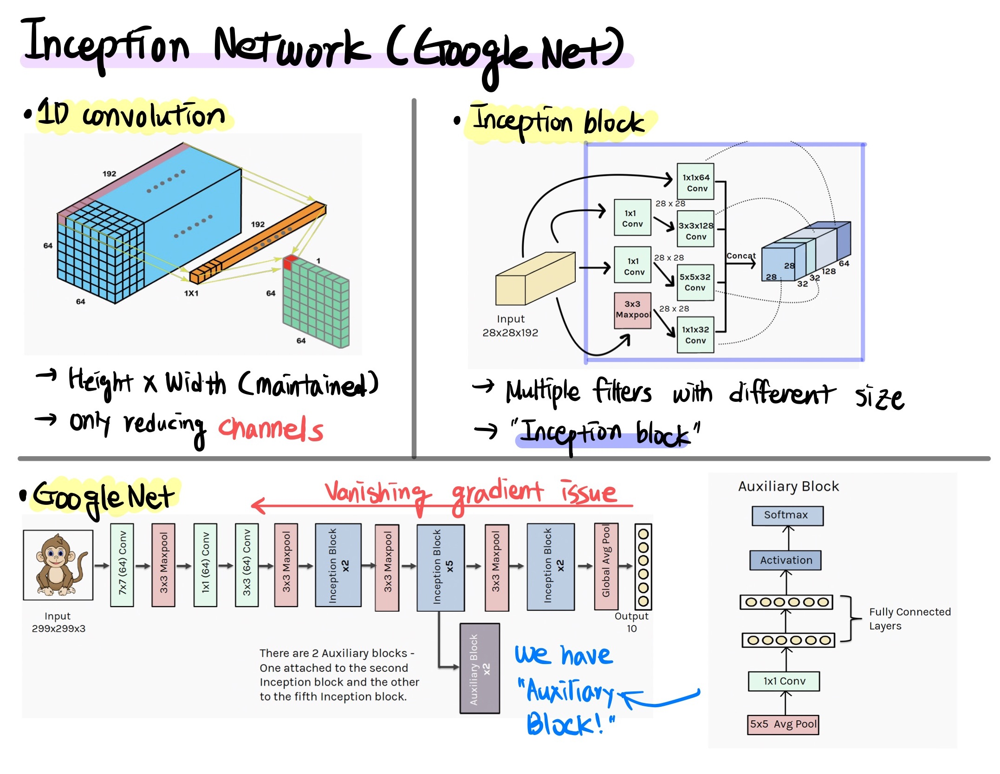

### 1. "Inception Block"

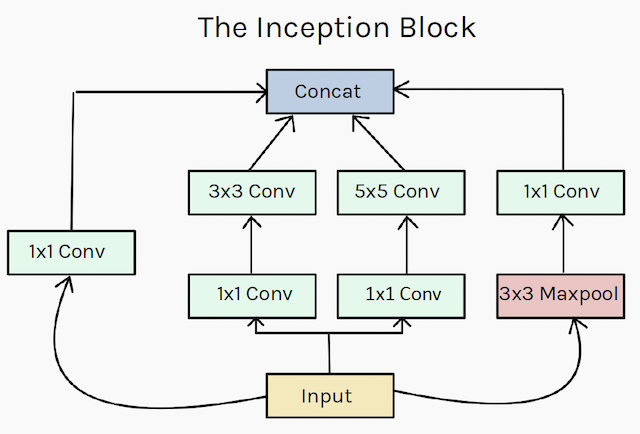

In [7]:
def inception_block(input_tensor, filters):
    # Branch 1
    branch1 = Conv2D(filters[0], (1,1), activation='relu')(input_tensor)

    # Branch 2
    branch2 = Conv2D(filters[1], (1,1), activation='relu')(input_tensor)
    branch2 = Conv2D(filters[2], (3,3), padding='same', activation='relu')(branch2)

    # Branch 3
    branch3 = Conv2D(filters[3], (1,1), activation='relu')(input_tensor)
    branch3 = Conv2D(filters[4], (5,5), padding='same', activation='relu')(branch3)

    # Branch 4
    branch4 = MaxPool2D((3,3), strides=(1,1), padding='same')(input_tensor)
    branch4 = Conv2D(filters[5], (1,1), activation='relu')(branch4)

    # Concatenate branches
    output_tensor = concatenate([branch1, branch2, branch3, branch4], axis=-1)

    return output_tensor

### 2. Auxiliary block

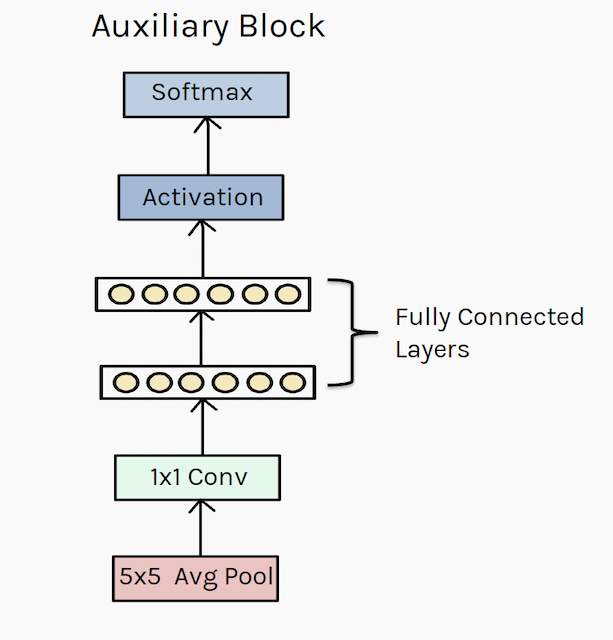

In [8]:
def auxiliary_block(input_tensor, aux_name):
    X = AveragePooling2D(pool_size = (5,5), strides = (3,3), padding='same')(input_tensor)
    X = Conv2D(filters = 128, kernel_size = (1,1), padding = 'same', activation = 'relu')(X)
    X = Flatten()(X)
    X = Dense(1024, activation = 'relu')(X)
    X = Dropout(0.7)(X)
    output_tensor = Dense(10, activation = 'softmax', name = aux_name)(X)

    return output_tensor

### 3. GoogLeNet

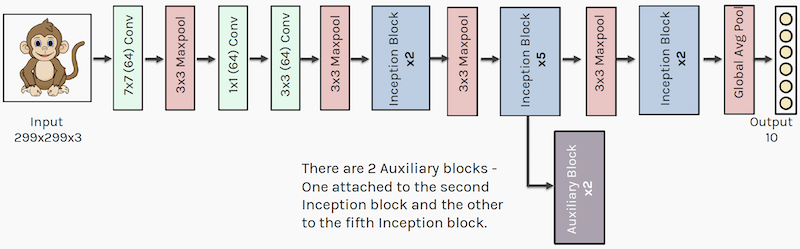

In [9]:
def GoogleNet(input_shape):
    inp = Input(shape=input_shape)

    X = Conv2D(64, (7,7), strides=(2,2), padding='same', activation='relu')(inp)
    X = MaxPool2D((3,3), strides=(2,2), padding='same')(X)
    X = Conv2D(64, (1,1), activation='relu')(X)
    X = Conv2D(192, (3,3), padding='same', activation='relu')(X)
    X = MaxPool2D((3,3), strides=(2,2), padding='same')(X)

    # First Inception blocks (x2)
    X = inception_block(X, [64, 96, 128, 16, 32, 32])
    X = inception_block(X, [128, 128, 192, 32, 96, 64])
    X = MaxPool2D((3,3), strides=(2,2), padding='same')(X)

    # Second Inception blocks (x5)
    X = inception_block(X, [192, 96, 208, 16, 48, 64])
    X = inception_block(X, [160, 112, 224, 24, 64, 64])
    X1 = auxiliary_block(X, aux_name = 'aux_output1') # First Auxiliary block

    X = inception_block(X, [128, 128, 256, 24, 64, 64])
    X = inception_block(X, [112, 144, 288, 32, 64, 64])
    X = inception_block(X, [256, 160, 320, 32, 128, 128])
    X2 = auxiliary_block(X, aux_name = 'aux_output2') # Second Auxiliary block

    # Third Inception blocks (x2)
    X = MaxPool2D((3,3), strides=(2,2), padding='same')(X)
    X = inception_block(X, [256, 160, 320, 32, 128, 128])
    X = inception_block(X, [384, 192, 384, 48, 128, 128])
    X = GlobalAvgPool2D()(X)
    X = Dense(10, activation='softmax', name='main_output')(X)
    model = Model(inputs=inp, outputs=[X, X1, X2])

    return model

## Brief overview of Residual Network (ResNet)

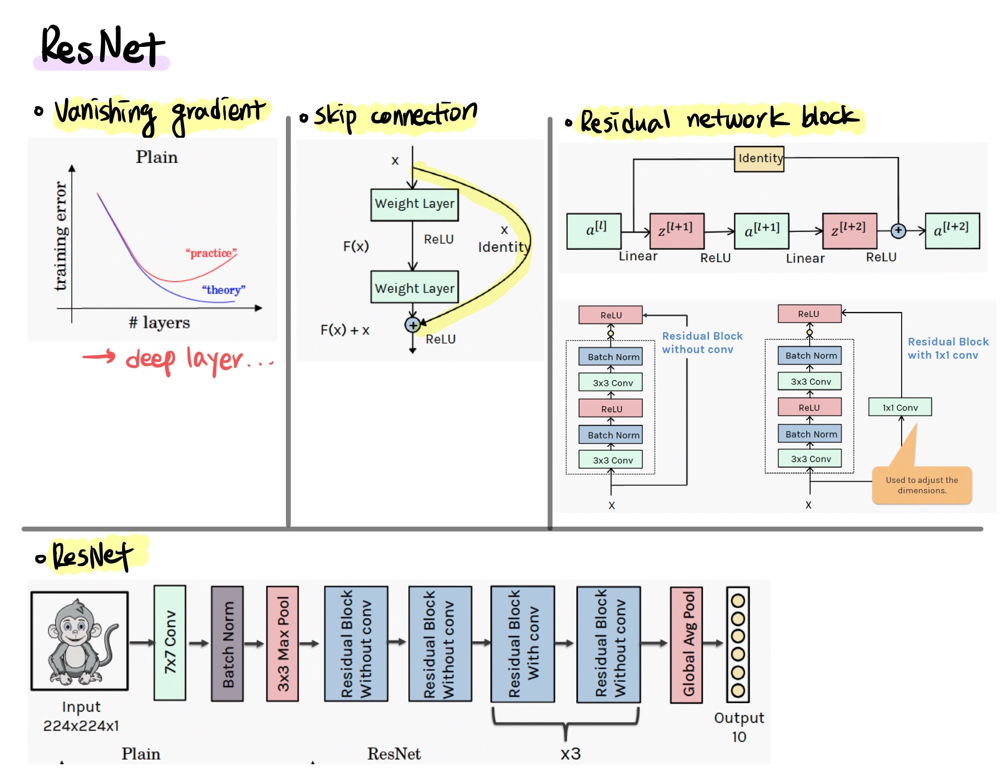

### 1. Residual Block

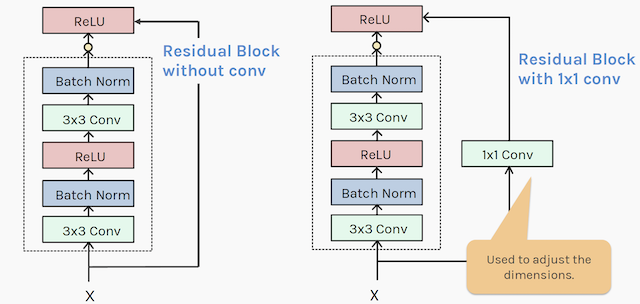

In [10]:
# Creating a Residual Block
def Residual(X, num_channels, strides=1, use_1x1conv=False):
    A = Conv2D(num_channels, kernel_size=3, padding='same', strides=strides)(X)
    A = BatchNormalization()(A)
    A = Activation('relu')(A)
    A = Conv2D(num_channels, kernel_size=3, padding='same')(A)
    A = BatchNormalization()(A)
    if use_1x1conv:
        X = Conv2D(num_channels, kernel_size=1, strides=strides)(X)
    A = Add()([A, X]) # Skip connection
    A = Activation('relu')(A)
    return A

### 2. ResNet

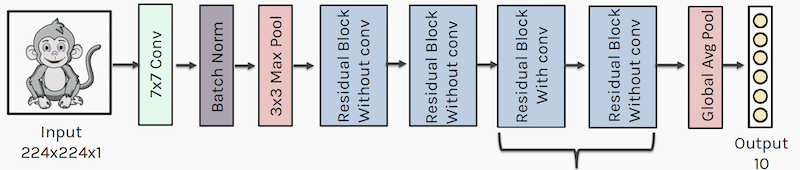

In [11]:
def ResNet(input_shape):
    inp = Input(shape=input_shape)
    X = Conv2D(64, kernel_size=7, strides=2, padding='same')(inp)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
    X = MaxPool2D(pool_size=3, strides=2, padding='same')(X)
    X = Residual(X, 64)
    X = Residual(X, 128, use_1x1conv=True, strides=2)
    X = GlobalAvgPool2D()(X)
    out = Dense(10, activation='softmax')(X)
    model = Model(inputs=inp, outputs=out)

    return model

## Exercise: Build a Model with Keras Functional API inspired by SOTA Arcitectures

### Choose the Model you would like to train (e.g. ResNet or Inception Network)

In [12]:
# Define the input shape
input_shape = (28,28,1)

model_name = 'ResNet' # or 'GoogleNet'

model = ResNet(input_shape)
title = 'ResNet'
print('Current model is ResNet!')

# Compiling the model
model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"])

Current model is ResNet!


#### Visualize the Model Architecture (requires `pydot` and `graphviz`)

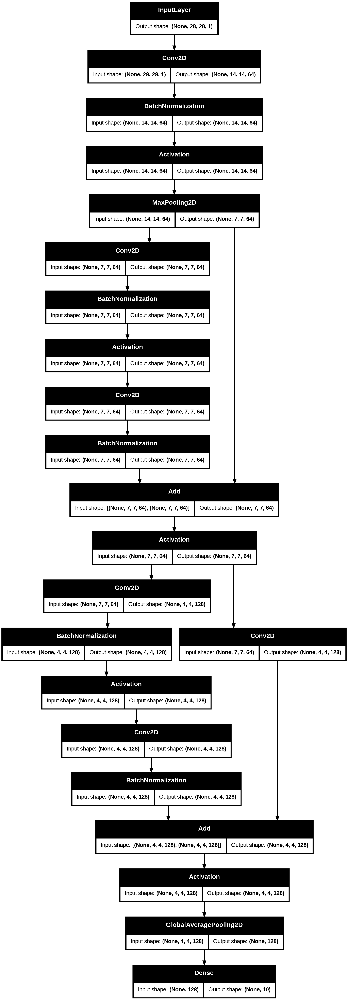

In [13]:
# Plotting the model
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=False)

#### Train Model

In [14]:
# Training the model
model.fit(traingen, epochs=10, batch_size=batch_size, validation_data=valgen)

Epoch 1/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 22s 5ms/step - accuracy: 0.9282 - loss: 0.2572 - val_accuracy: 0.9277 - val_loss: 0.2415
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9830 - loss: 0.0576 - val_accuracy: 0.9797 - val_loss: 0.0654
Epoch 3/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.9881 - loss: 0.0397 - val_accuracy: 0.9808 - val_loss: 0.0615
Epoch 4/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9902 - loss: 0.0303 - val_accuracy: 0.9820 - val_loss: 0.0583
Epoch 5/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.9931 - loss: 0.0223 - val_accuracy: 0.9828 - val_loss: 0.0582
Epoch 6/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9940 - loss: 0.0180 - val_accuracy: 0.9839 - val_loss: 0.0551
Epoch 7/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.9955 - loss: 0.0143 - val_accuracy: 0.9878 - val_loss: 0.0421
Epoch 8/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.9964 - loss: 0.0110 -

#### Training History

In [15]:
# Helper function for plotting training history
def plot_history(model, title):
    # plot 'Loss'
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    axs[0].plot(model.history.history['loss'], label='train')
    axs[0].plot(model.history.history['val_loss'], label='validation')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Loss')
    best_loss = np.nanmin(model.history.history['val_loss'])
    axs[0].axvline(np.nanargmin(model.history.history['val_loss']),
                c='k', ls='--',
                label=f'best val loss = {best_loss:.2f}')
    axs[0].legend()
    axs[0].set_title('Loss')

    # in case the Network has multiple outputs
    train_accuracy = []
    val_accuracy = []

    for cur_history in model.history.history:
        if 'accuracy'in cur_history:
            if 'val' in cur_history:
                val_accuracy.append(model.history.history[cur_history])
            else:
                train_accuracy.append(model.history.history[cur_history])

    train_accuracy = np.mean(np.array(train_accuracy), axis=0)
    val_accuracy = np.mean(np.array(val_accuracy), axis = 0)

    # plot 'Accuracy'
    axs[1].plot(train_accuracy, label='train')
    axs[1].plot(val_accuracy, label='validation')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Accuracy')
    best_accuracy = np.nanmax(val_accuracy)
    axs[1].axvline(np.nanargmax(val_accuracy),
                c='k', ls='--',
                label=f'best val accuracy = {best_accuracy:.5f}')
    axs[1].legend()
    axs[1].set_title('Accuracy')
    plt.suptitle(title)

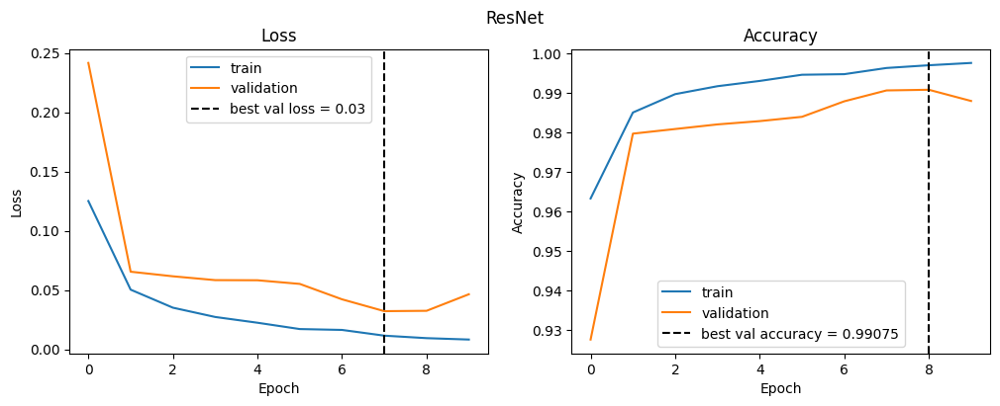

In [16]:
# plot the history of model training
plot_history(model, title = 'ResNet')

#### Evaluation

In [17]:
# evaluate the model on test data
result = model.evaluate(x_test, y_test, verbose=0)
if len(model.metrics_names) > 2:
    test_loss_idx = model.metrics_names.index('main_output_loss')
    test_accuracy_idx = model.metrics_names.index('main_output_accuracy')
    test_loss, test_accuracy = result[test_loss_idx], result[test_accuracy_idx]
else:
    test_loss, test_accuracy = result

print('Test accuracy:', round(test_accuracy, 3))

Test accuracy: 0.989


### CS109bNet
Let's construct and trainthe following model:

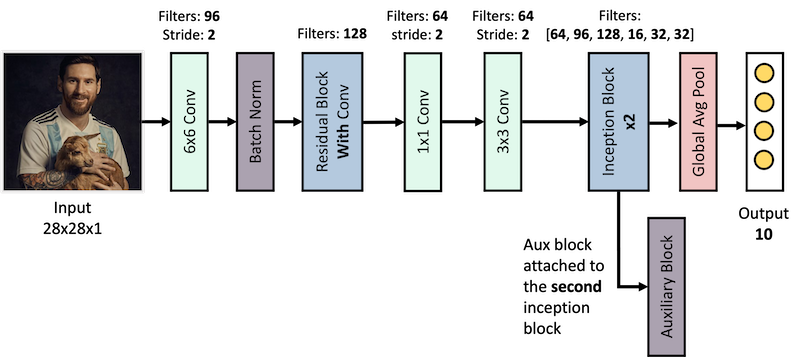

In [18]:
def cs109bNet(input_shape):
    inp = Input(shape=input_shape)

    X = Conv2D(96, kernel_size=6, strides=2, padding='same')(inp)
    X = BatchNormalization()(X)
    X = Residual(X, 128, use_1x1conv=True, strides=2)
    X = Conv2D(64, kernel_size=1, strides=2, activation='relu', padding='same')(X)
    X = Conv2D(64, kernel_size=3, strides=2, activation='relu', padding='same')(X)
    X = inception_block(X, [64, 96, 128, 16, 32, 32])
    X = inception_block(X, [64, 96, 128, 16, 32, 32])
    X1 = auxiliary_block(X, aux_name = 'aux_output')
    X = GlobalAvgPool2D()(X)
    X = Dense(10, activation='softmax', name = 'main_output')(X)
    model = Model(inputs=inp, outputs=[X, X1])
    return model

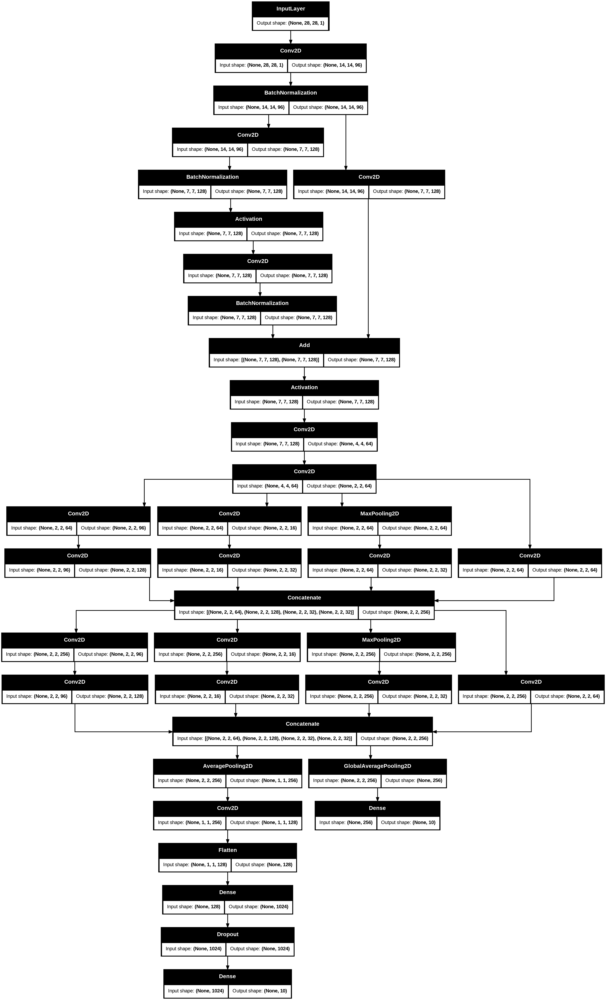

In [19]:
input_shape = (28,28,1)

model = cs109bNet(input_shape)

# Plotting the model
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=False)

In [20]:
# Compiling the model
model.compile(optimizer=Adam(),
              loss={'main_output': SparseCategoricalCrossentropy(), # Loss for the main output
                    'aux_output': SparseCategoricalCrossentropy()}, # Loss for the auxiliary output
              loss_weights={'main_output': 1.0, 'aux_output': 0.3}, # Weighting the losses
              metrics=["accuracy", "accuracy"])

def duplicate_label(x, y):
    return x, {'main_output': y, 'aux_output': y}

# Creating new dataset objects with the duplicated labels
traingen_duplicated = tf.data.Dataset.from_tensor_slices((x_train, y_train)).map(duplicate_label).batch(batch_size)
valgen_duplicated = tf.data.Dataset.from_tensor_slices((x_val, y_val)).map(duplicate_label).batch(batch_size)


# Training the model
model.fit(traingen_duplicated,
          epochs=10,
          batch_size=batch_size,
          validation_data=valgen_duplicated)

Epoch 1/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 29s 9ms/step - aux_output_accuracy: 0.8623 - aux_output_loss: 0.4468 - loss: 0.4712 - main_output_accuracy: 0.8976 - main_output_loss: 0.3371 - val_aux_output_accuracy: 0.9467 - val_aux_output_loss: 0.2131 - val_loss: 0.2312 - val_main_output_accuracy: 0.9540 - val_main_output_loss: 0.1672
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - aux_output_accuracy: 0.9705 - aux_output_loss: 0.1197 - loss: 0.1255 - main_output_accuracy: 0.9741 - main_output_loss: 0.0896 - val_aux_output_accuracy: 0.9722 - val_aux_output_loss: 0.1075 - val_loss: 0.1121 - val_main_output_accuracy: 0.9762 - val_main_output_loss: 0.0799
Epoch 3/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - aux_output_accuracy: 0.9771 - aux_output_loss: 0.0937 - loss: 0.0961 - main_output_accuracy: 0.9809 - main_output_loss: 0.0680 - val_aux_output_accuracy: 0.9705 - val_aux_output_loss: 0.1413 - val_loss: 0.1364 - val_main_output_accuracy: 0.9756 - val_main_output_loss: 0.0940
E

In [21]:
# evaluate the model on test data
inference_model = Model(inputs=model.input, outputs=model.get_layer('main_output').output)
inference_model.compile(optimizer=Adam(), loss=SparseCategoricalCrossentropy(), metrics=["accuracy"])
test_loss, test_accuracy = inference_model.evaluate(x_test, y_test)
print('Test accuracy:', round(test_accuracy, 3))

313/313 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.9806 - loss: 0.0731
Test accuracy: 0.985


# Transfer Learning

### Basic Idea + Motivation of Transfer Learning

- Transfer learning (TL) focuses on storing knowledge gained while solving one
problem and applying it to a different but related problem

- Use pre-trained models (models with pretrained weights)
- Particularly useful when:
  - Not enough data is available!
  - Model training takes too long!

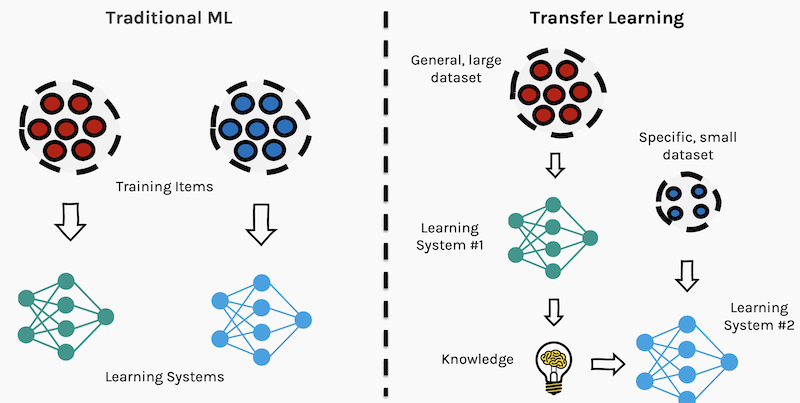

### Some Approaches to Implement TL For Image Classification

Approach 1:

- Use a pretrained network such as MobileNet or VGG and freeze CNN layer weights
- Train the fully connected network on the new dataset

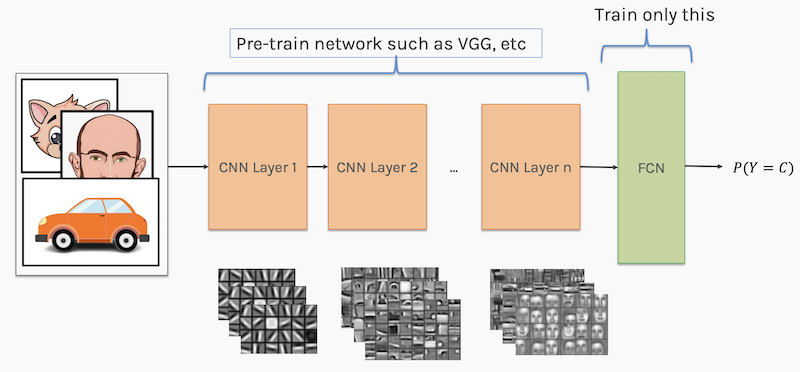

Approach 2:
- Use a pretrained network such as MobileNet or VGG and freeze all but the last few CNN layer weights
- Train the last few CNN layer weights and the fully connected network on the new dataset

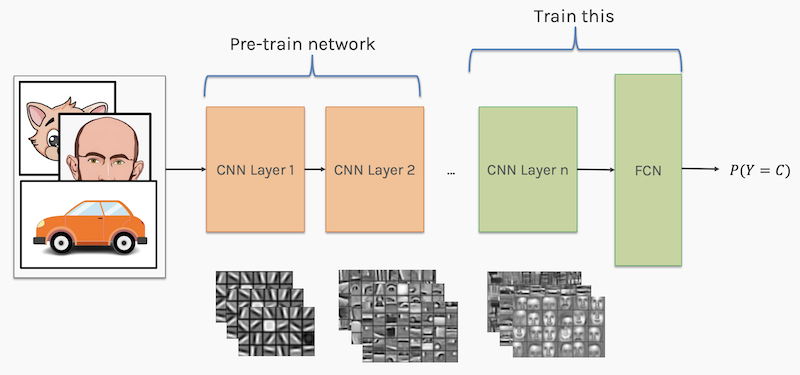

Approach 3:
- Use a pretrained network such as MobileNet or VGG and freeze no weights
- Train weights from all layers on the new dataset
- How could we improve this approach by being a bit more careful about how we change the weights?

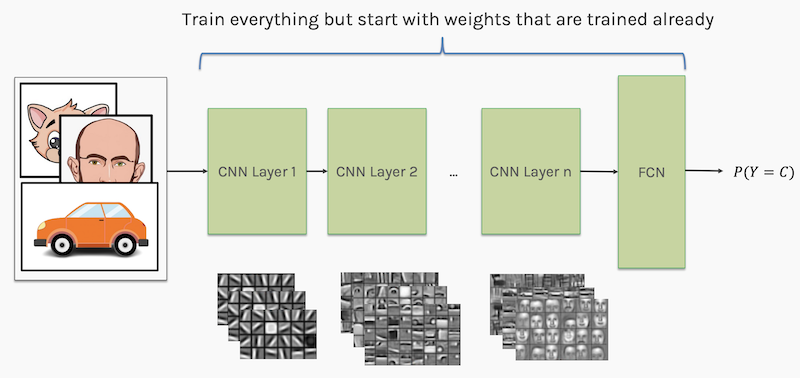

### Load Dataset


Below, we load in a "cats vs dogs" dataset and examine the number of samples in the training, validation, and test sets:

In [22]:
import tensorflow_datasets as tfds

# disable the progress bar
tfds.disable_progress_bar()

# load in 60% of the full "cats vs dogs" dataset to create artificial data scarcity
train_ds, validation_ds, test_ds = tfds.load(
    "cats_vs_dogs",
    # save 10% for a validation set and 10% for a test set
    split=["train[:40%]", "train[40%:50%]", "train[50%:60%]"],
    # include class labels
    as_supervised=True,
)

print("Number of training samples: %d" % tf.data.experimental.cardinality(train_ds))
print("Number of validation samples: %d" % tf.data.experimental.cardinality(validation_ds))
print("Number of test samples: %d" % tf.data.experimental.cardinality(test_ds))

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.
Number of training samples: 9305
Number of validation samples: 2326
Number of test samples: 2326


### Examine the Data

- Let's take a quick look at some of the images as well as their labels:
 - 1 : dog
 - 0 : cat

- Note: _take(count, name=None)_ enables us to create a dataset with at most count elements from this dataset

- Notice that all the images, as is, are different sizes!

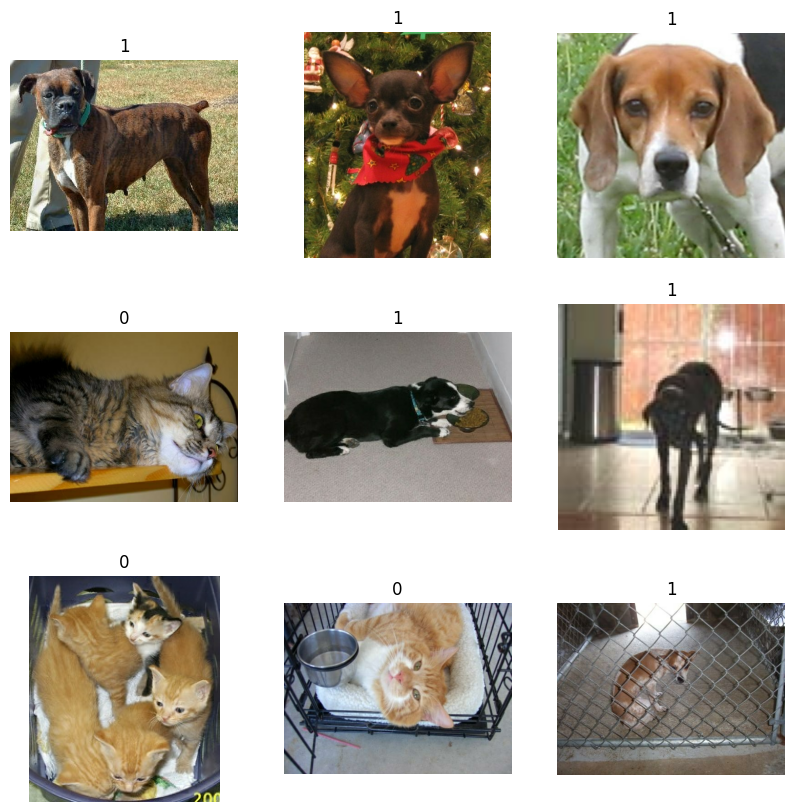

In [23]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

# output the first 9 images of the training dataset
for i, (image, label) in enumerate(train_ds.take(9)):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.title(int(label))
    plt.axis("off")

### Preprocess the Data

- The raw images, as we just noticed, are of varying sizes. Moreover, each pixel consists of 3 RGB values. This image structure is not conducive to training a neural network
- Let's resolve these two issues as follows:
  - Standardize all images to a fixed size (say 150 x 150)
  - Normalize pixel values between -1 and 1
- Instead of doing most of the preprocessing before we create the model, let's try to develop a model that handles most of the preprocessing "on the fly". Why might this be a good idea?

 Resizing

In [24]:
# let's fix an image size to adjust all our images to
size = (150, 150)

# transform all three datasets via the "map" function
train_ds = train_ds.map(lambda x, y: (tf.image.resize(x, size), y))
validation_ds = validation_ds.map(lambda x, y: (tf.image.resize(x, size), y))
test_ds = test_ds.map(lambda x, y: (tf.image.resize(x, size), y))

Batching, caching, and prefetching

In [25]:
# batch the data
batch_size = 32

# use caching and prefetching to optimize loading speed
train_ds = train_ds.cache().batch(batch_size).prefetch(buffer_size=10)
validation_ds = validation_ds.cache().batch(batch_size).prefetch(buffer_size=10)
test_ds = test_ds.cache().batch(batch_size).prefetch(buffer_size=10)

Data Augmentation



- In cases where we don't have a large image dataset, we can leverage data augmentation to introduce some artificial diversity into the data
- This will enable us to perform random but realistic transformations to the training images, as you might have done in HW 3
- Let's see how we can actually do data augmentation with a sequential network using transformation type layers from Keras

In [26]:
# create a "partial" network with two layers that randomly horizontally flip and rotate an image
data_augmentation = keras.Sequential(
    [layers.RandomFlip("horizontal"), layers.RandomRotation(0.1),]
)

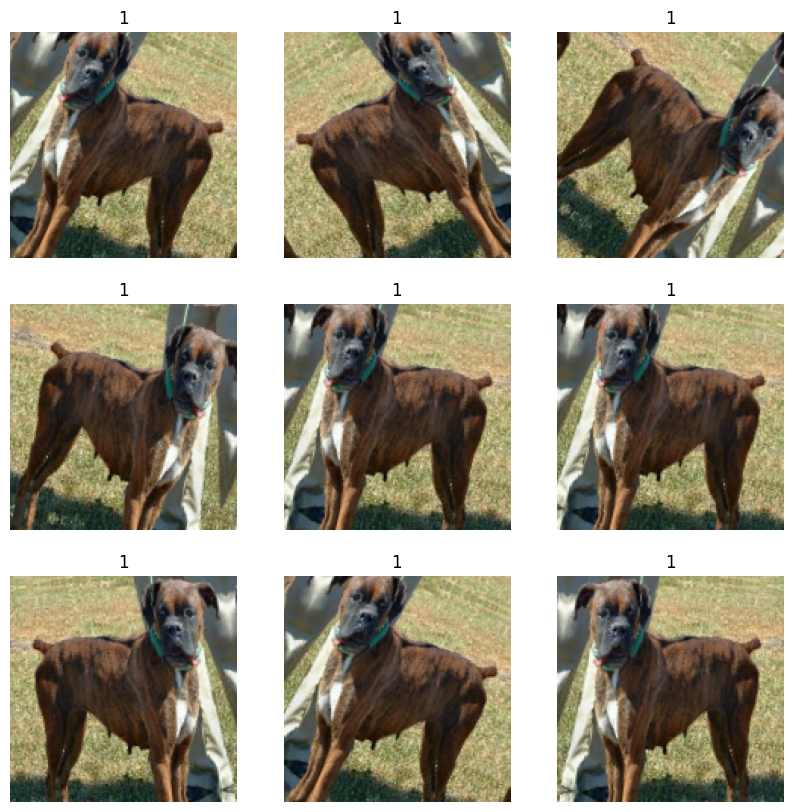

In [27]:
# generate 9 different variants of the first image from the training dataset
for images, labels in train_ds.take(1):
    plt.figure(figsize=(10, 10))
    first_image = images[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        # apply the transformation layers
        augmented_image = data_augmentation(
            tf.expand_dims(first_image, 0), training=True
        )
        plt.imshow(augmented_image[0].numpy().astype("int32"))
        plt.title(int(labels[0]))
        plt.axis("off")

### Fine-Tuning Transfer Learning

How do we perform fine-tuning?
0. Load in a pre-trained model (model with pretrained weights)
1. Freeze all of the convolutional base layers
2. Add a new fully connected head that is suited to the new task
3. Train the fully connected head that you added while keeping the convolutional base fixed
4. Unfreeze some "later" layers (or all layers) in the base network and train the base network and fully connected network together

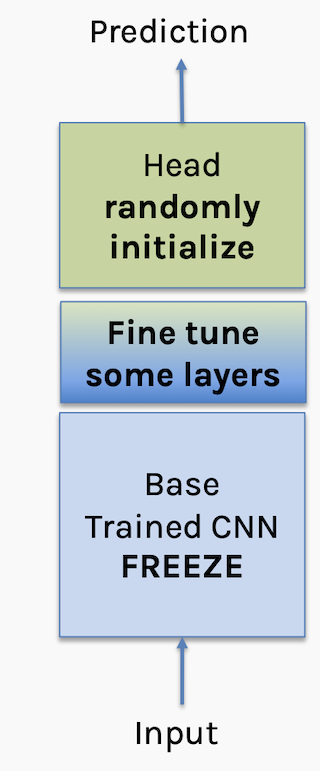

Step 0:

- Load in a pre-trained, base model from `keras.applications`. Here we use a small version of MobileNetV3
- Notice that we exclude the 'top', meaning we omit the final layer used for imagenet classification (which the model was originally trained on)

In [28]:
base_model = keras.applications.MobileNetV3Small(
    weights='imagenet',  # load weights pre-trained on ImageNet
    input_shape=(150, 150, 3),
    include_preprocessing=False,
    include_top=False)  # do not include the ImageNet classifier at the top

/usr/local/lib/python3.11/dist-packages/keras/src/applications/mobilenet_v3.py:452: UserWarning: `input_shape` is undefined or non-square, or `rows` is not 224. Weights for input shape (224, 224) will be loaded as the default.
  return MobileNetV3(


4334752/4334752 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Step 1:

- Freeze the pre-trained weights

In [29]:
# fixes all base model weights to their current values (i.e. will not be updated)
base_model.trainable = False

Step 2:
- Add data augmentation and scaling before the base model
- Add global average pooling and a final trainable Dense layer after the base model (new fully connected head)
- Note the difference between base_model.trainable=False and training=False below

In [30]:
# create a new input layer for our data
inputs = keras.Input(shape=(150, 150, 3))
# apply random data augmentation
x = data_augmentation(inputs)

# create a scaling layer that scales input from (0, 255) to a range of (-1., +1.)
# because pre-trained MobileNet weights require this
scale_layer = keras.layers.Rescaling(scale=1 / 127.5, offset=-1)
# rescaling layer outputs `(inputs * scale) + offset`
x = scale_layer(x)

# the base model contains batchnorm layers and we want them in inference mode,
# hence set training=False
x = base_model(x, training=False)
# no parameters to train with global average pooling
x = keras.layers.GlobalAveragePooling2D()(x)
# no parameters to train with dropout
x = keras.layers.Dropout(0.2)(x)
# currently the only trainable layer
outputs = keras.layers.Dense(1)(x)
model = keras.Model(inputs, outputs)

# output the model summary
model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 150, 150, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential (Sequential)              │ (None, 150, 150, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling (Rescaling)                │ (None, 150, 150, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNetV3Small (Functional)        │ (None, 5, 5, 576)           │         939,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 576)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 576)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │             577 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 939,697 (3.58 MB)

 Trainable params: 577 (2.25 KB)

 Non-trainable params: 939,120 (3.58 MB)

Step 3:
- Train the new fully connected head
- Keep the convolutional base fixed
- Note that only the parameters of the final layer are being adjusted

In [31]:
# compile the model
model.compile(
    optimizer=keras.optimizers.Adam(),
    loss=keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=[keras.metrics.BinaryAccuracy()],
)

# fit the model with a small number of epochs (really should use patience + early stopping!)
epochs = 5
model.fit(train_ds, epochs=epochs, validation_data=validation_ds)

Epoch 1/5
291/291 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - binary_accuracy: 0.7789 - loss: 0.4301 - val_binary_accuracy: 0.9286 - val_loss: 0.1827
Epoch 2/5
291/291 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - binary_accuracy: 0.8934 - loss: 0.2429 - val_binary_accuracy: 0.9364 - val_loss: 0.1616
Epoch 3/5
291/291 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - binary_accuracy: 0.8985 - loss: 0.2280 - val_binary_accuracy: 0.9411 - val_loss: 0.1592
Epoch 4/5
291/291 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - binary_accuracy: 0.9047 - loss: 0.2183 - val_binary_accuracy: 0.9411 - val_loss: 0.1534
Epoch 5/5
291/291 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - binary_accuracy: 0.9031 - loss: 0.2151 - val_binary_accuracy: 0.9433 - val_loss: 0.1506


Step 4:

- Unfreeze all the layers of the base network
- Train the base network and fully connected network together
- Note 1: even though the base model is now trainable, it still runs in inference mode (training=False) because we don't want the batch normalization layers to update their batch statistics
- Note 2: we use a very small learning rate to avoid overfitting (training a large model on a small dataset)


In [32]:
# your code here
# set the base network weights to trainable
base_model.trainable = True
model.summary()

# compile the new model with trainable base network weights
model.compile(
    optimizer=keras.optimizers.Adam(1e-5),
    loss=keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=[keras.metrics.BinaryAccuracy()],
)

# fit the model with a small number of epochs (really should use patience + early stopping!)
epochs = 10
model.fit(train_ds, epochs=epochs, validation_data=validation_ds)

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 150, 150, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential (Sequential)              │ (None, 150, 150, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling (Rescaling)                │ (None, 150, 150, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNetV3Small (Functional)        │ (None, 5, 5, 576)           │         939,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 576)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 576)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │             577 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 940,853 (3.59 MB)

 Trainable params: 927,585 (3.54 MB)

 Non-trainable params: 12,112 (47.31 KB)

 Optimizer params: 1,156 (4.52 KB)

Epoch 1/10
291/291 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - binary_accuracy: 0.7682 - loss: 0.5655 - val_binary_accuracy: 0.9377 - val_loss: 0.1486
Epoch 2/10
291/291 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - binary_accuracy: 0.8321 - loss: 0.3790 - val_binary_accuracy: 0.9334 - val_loss: 0.1590
Epoch 3/10
291/291 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - binary_accuracy: 0.8538 - loss: 0.3189 - val_binary_accuracy: 0.9291 - val_loss: 0.1702
Epoch 4/10
291/291 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - binary_accuracy: 0.8638 - loss: 0.3020 - val_binary_accuracy: 0.9291 - val_loss: 0.1646
Epoch 5/10
291/291 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - binary_accuracy: 0.8742 - loss: 0.2764 - val_binary_accuracy: 0.9312 - val_loss: 0.1660
Epoch 6/10
291/291 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - binary_accuracy: 0.8833 - loss: 0.2576 - val_binary_accuracy: 0.9325 - val_loss: 0.1672
Epoch 7/10
291/291 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - binary_accuracy: 0.8901 - loss: 0.2480 - val_binary_accuracy: 0.9351 - val_loss:

# Visualizing CNNs

## What is Driving the Prediction?

In [33]:
from IPython.display import Image, display
from matplotlib import cm

Let's load the pretrained Xception model and try to determine why it makes the predictions that it does through visualizations.

In [34]:
model_builder = keras.applications.xception.Xception
img_size = (299, 299)
preprocess_input = keras.applications.xception.preprocess_input
decode_predictions = keras.applications.xception.decode_predictions

# Make model
model = model_builder(weights="imagenet")
model.summary()

91884032/91884032 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "xception"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 299, 299, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 149, 149, 32)   │            864 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_bn           │ (None, 149, 149, 32)   │            128 │ block1_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_act          │ (None, 149, 149, 32)   │              0 │ block1_conv1_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 147, 147, 64)   │         18,432 │ block1_conv1_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_bn           │ (None, 147, 147, 64)   │            256 │ block1_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_act          │ (None, 147, 147, 64)   │              0 │ block1_conv2_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1           │ (None, 147, 147, 128)  │          8,768 │ block1_conv2_act[0][0] │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1_bn        │ (None, 147, 147, 128)  │            512 │ block2_sepconv1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_act       │ (None, 147, 147, 128)  │              0 │ block2_sepconv1_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2           │ (None, 147, 147, 128)  │         17,536 │ block2_sepconv2_act[0… │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_bn        │ (None, 147, 147, 128)  │            512 │ block2_sepconv2[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_25 (Conv2D)        │ (None, 74, 74, 128)    │          8,192 │ block1_conv2_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 74, 74, 128)    │              0 │ block2_sepconv2_bn[0]… │
│ (MaxPooling2D)            │                        │                │                        │
├──────────────────────

 Total params: 22,910,480 (87.40 MB)

 Trainable params: 22,855,952 (87.19 MB)

 Non-trainable params: 54,528 (213.00 KB)

Here's a nice example image. Mmmmm!

331139/331139 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


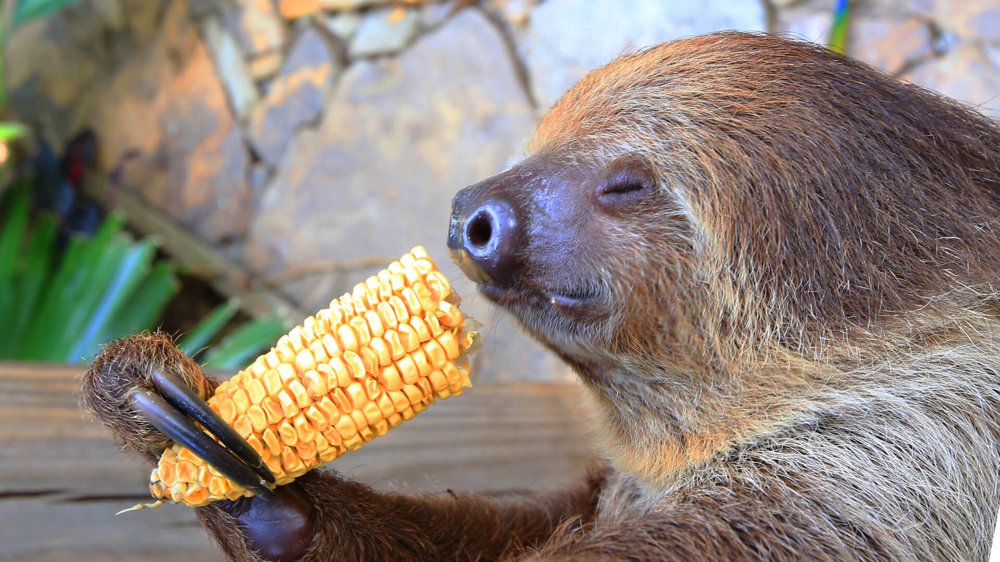

In [35]:
img_path = keras.utils.get_file(
    "sloth5.jpg",
    "https://i.redd.it/r4fpzxsm8l721.jpg",
)

display(Image(img_path))

Preprocess the image so it can be fed into the network. Then we decode the predictions and look at the top 5.

In [36]:
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array

# Prepare image
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Print what the two top predicted classes are
preds = model.predict(img_array)
print("Predicted:", decode_predictions(preds, top=5)[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 1us/step
Predicted: [('n13133613', 'ear', 0.5357808), ('n12144580', 'corn', 0.38380206), ('n02457408', 'three-toed_sloth', 0.0040874397), ('n03843555', 'oil_filter', 0.0036377017), ('n03884397', 'panpipe', 0.0021661995)]


Create mappings to find the output index corresponding to a particular class name as well as the inverse mapping.

In [37]:
sorted_idxs = np.argsort(preds[0])[::-1]
decoded_preds = decode_predictions(preds, top=1000)[0]
class_idx = {n: i for (ID, n, p), i in zip(decoded_preds, sorted_idxs)}
class_names = {v: k for k,v in class_idx.items()}

### Saliency Maps & GradCAM

A **saliency map** highlights the most important regions of an input image for a specific class prediction in a CNN. It is produced by taking the gradient of the output class score with respect to the input image.

A **smoothed saliency map** is a variant of a saliency map that has been filtered or blurred to produce a more visually appealing and interpretable output. This can be achieved by convolving the raw saliency map with a smoothing kernel, such as a Gaussian filter.

Gradient-weighted Class Activation Mapping (**GradCAM**) generates a heatmap to highlight the most relevant regions in the input image that contributed to a particular class score in a CNN. It is produced by taking the gradient of the output class score with respect to the feature maps in the final convolutional layer of the CNN.

### With `tf_keras_vis`

In [38]:
!pip install tf_keras_vis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 4.8 MB/s eta 0:00:00


In [39]:
from tf_keras_vis.saliency import Saliency
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear



# our model returns logits
# so we don't actually need to use a modifier function
def model_modifier(model):
    model.layers[-1].activation = tf.keras.activations.linear

# or you could use this function from the tf_keras_vis library
# which is equivalent
replace2linear = ReplaceToLinear()

# example instantiation of vis objects
saliency = Saliency(model, model_modifier=model_modifier, clone=True)
gradcam = Gradcam(model, model_modifier=replace2linear, clone=True)

In [40]:
from tf_keras_vis.utils.scores import CategoricalScore

def generate_saliency_map(model, img, class_index, smooth_samples=0):
    saliency = Saliency(model)
    score = CategoricalScore([class_index])
    saliency_map = saliency(score, img, smooth_samples)
    return saliency_map

In [41]:
def generate_gradcam(model, img, class_index):
    gradcam = Gradcam(model)
    score = CategoricalScore([class_index])
    # This is equivalent to the above use of CategoricalScore
    # score = lambda outputs: outputs[:, class_index]
    gradcam_results = gradcam(score, img)
    return gradcam_results

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_244
Received: inputs=['Tensor(shape=(1, 299, 299, 3))']
  warnings.warn(msg)


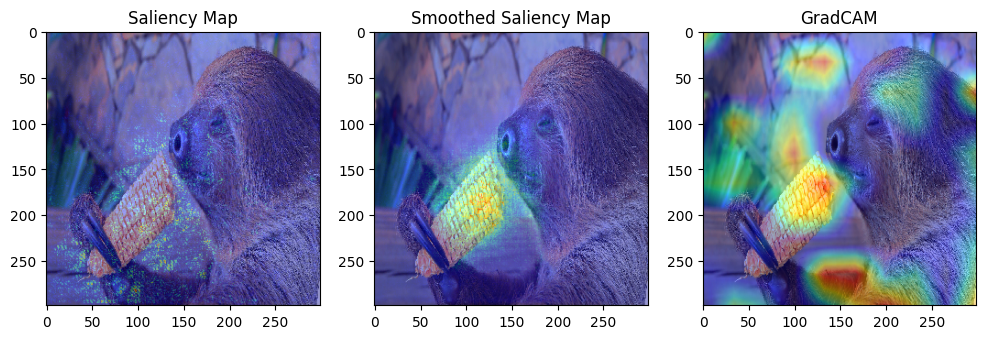

In [42]:
fig, ax = plt.subplots(1,3, figsize=(12,5))
target_class_idx = class_idx['corn']
saliency_map = generate_saliency_map(model,
                                     img_array,
                                     target_class_idx)
ax[0].imshow((img_array[0]+1)/2) # img had range [-1,1]
ax[0].imshow(saliency_map[0], cmap='jet', alpha=0.4)
ax[0].set_title('Saliency Map')
saliency_map_smoothed = generate_saliency_map(model,
                                           img_array,
                                           target_class_idx,
                                           smooth_samples=40)
ax[1].imshow((img_array[0]+1)/2)
ax[1].imshow(saliency_map_smoothed[0], cmap='jet', alpha=0.4)
ax[1].set_title('Smoothed Saliency Map')
gradcam_results = generate_gradcam(model,
                                   img_array,
                                   target_class_idx)
ax[2].imshow((img_array[0]+1)/2)
ax[2].imshow(gradcam_results[0], cmap='jet', alpha=0.4)
ax[2].set_title('GradCAM');

### GradCAM with `gradient_tape`

10321/10321 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


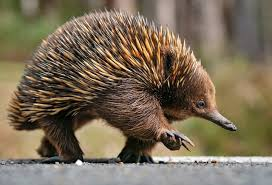

In [43]:
# The local path to our target image
img_path = keras.utils.get_file(
    "echidna2.jpg",
    "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTog-McL6bqiS8_-N6GcnyHHJ4vN235r5LFWHPZVfK7xJzuTBKF",
)

display(Image(img_path))

In [44]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
Predicted: [('n01872401', 'echidna', 0.8889087)]


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_244']]
Received: inputs=Tensor(shape=(1, 299, 299, 3))
  warnings.warn(msg)


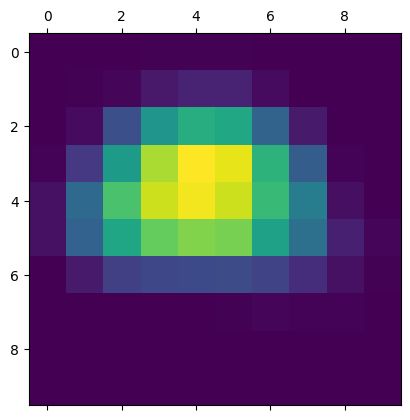

In [45]:
# Prepare image
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Remove last layer's softmax
model.layers[-1].activation = None

# Print what the top predicted class is
preds = model.predict(img_array)
print("Predicted:", decode_predictions(preds, top=1)[0])

# Generate class activation heatmap
last_conv_layer_name = "block14_sepconv2_act"
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

<ipython-input-46-34e0b9574523>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


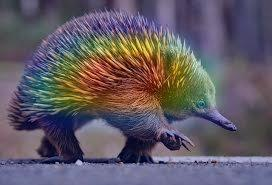

In [46]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))


save_and_display_gradcam(img_path, heatmap)

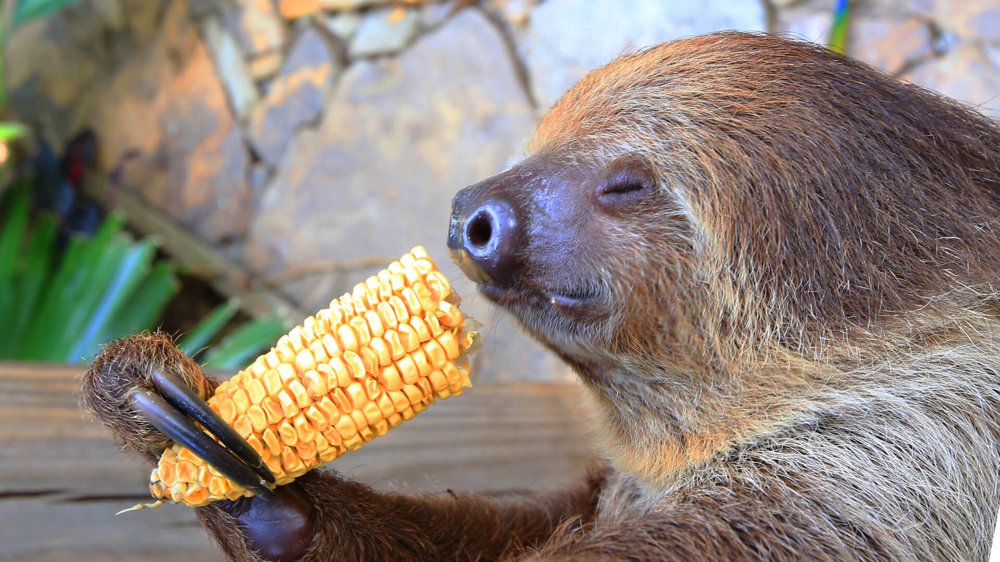

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Predicted: [('n13133613', 'ear', 0.5357808), ('n12144580', 'corn', 0.38380206), ('n02457408', 'three-toed_sloth', 0.0040874397), ('n03843555', 'oil_filter', 0.0036377017), ('n03884397', 'panpipe', 0.0021661995)]


In [47]:
img_path = keras.utils.get_file(
    "sloth5.jpg",
    "https://i.redd.it/r4fpzxsm8l721.jpg",
)

display(Image(img_path))

# Prepare image
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Print what the two top predicted classes are
preds = model.predict(img_array)
print("Predicted:", decode_predictions(preds, top=5)[0])

<ipython-input-46-34e0b9574523>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


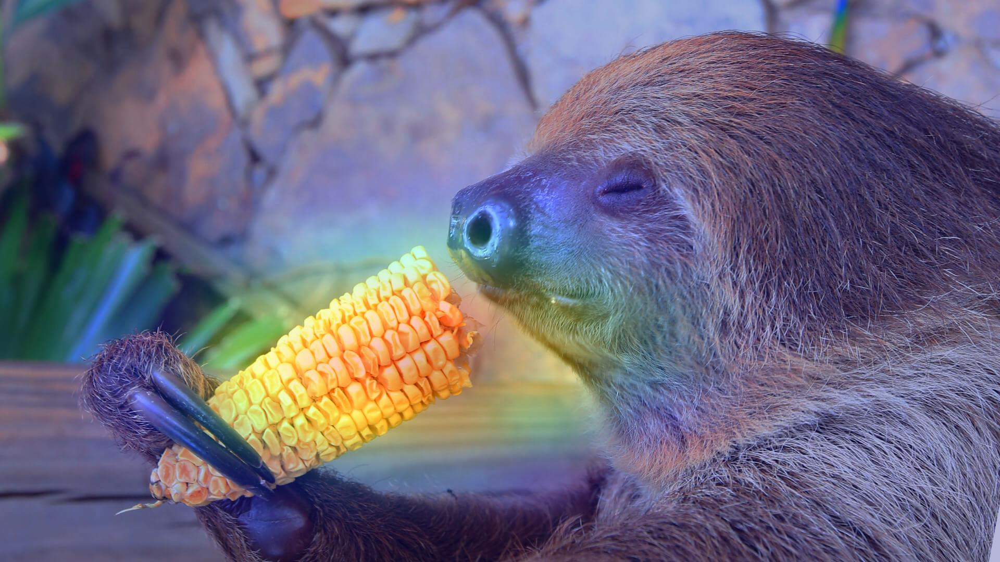

In [48]:
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=class_idx['corn'])

save_and_display_gradcam(img_path, heatmap)

<ipython-input-46-34e0b9574523>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


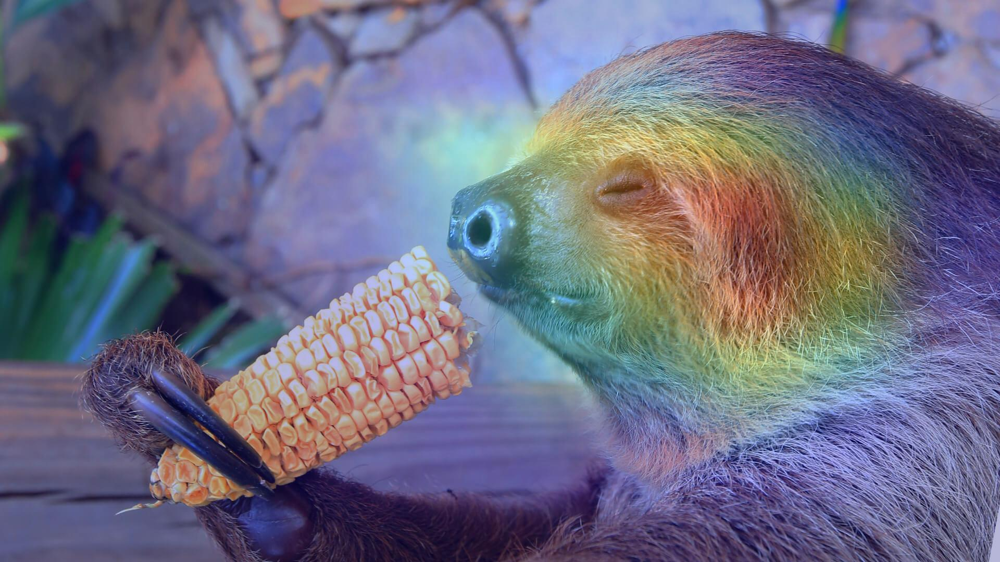

In [49]:
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name,
                               pred_index=class_idx['three-toed_sloth'])

save_and_display_gradcam(img_path, heatmap)

## What Has the CNN Learned?
### Activation Maximization

Activation Maximization is a technique used to generate synthetic input images that maximally activate specific neurons or filters in a CNN. It is achieved by iteratively updating an initial random image to maximize the activation of a particular neuron or set of neurons, typically by backpropagating the gradients of the neuron(s) with respect to the input image.

In [50]:
# Build a ResNet50V2 model loaded with pre-trained ImageNet weights
model = keras.applications.ResNet50V2(weights="imagenet", include_top=False)
# The dimensions of our input image
img_width = 180
img_height = 180
# Our target layer: we will visualize the filters from this layer.
# See `model.summary()` for list of layer names, if you want to change this.
layer_name = "conv3_block4_out"
model.summary()

94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "resnet50v2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, None, None, 3)  │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, None, None, 3)  │              0 │ input_layer_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, None, None, 64) │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, None, None, 64) │              0 │ conv1_conv[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, None, None, 64) │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_bn    │ (None, None, None, 64) │            256 │ pool1_pool[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_relu  │ (None, None, None, 64) │              0 │ conv2_block1_preact_b… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, None, None, 64) │          4,096 │ conv2_block1_preact_r… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, None, None, 64) │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, None, None, 64) │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_pad        │ (None, None, None, 64) │              0 │ conv2_block1_1_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, None, None, 64) │         36,864 │ conv2_block1_2_pad[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, None, None, 64) │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, None, None, 64) │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv  

 Total params: 23,564,800 (89.89 MB)

 Trainable params: 23,519,360 (89.72 MB)

 Non-trainable params: 45,440 (177.50 KB)

#### Activation Maximization with `gradient_tape`

Build a feature extraction model.

In [51]:
# Set up a model that returns the activation values for our target layer
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.inputs, outputs=layer.output)

**Set up the gradient ascent process**

The objective function we will maximize is simply the mean of the activation of a specific filter in our target layer. To avoid border effects, we exclude border pixels.

In [52]:
def compute_objective(input_image, filter_index, tv_weight=0):
    activation = feature_extractor(input_image)
    # We avoid border artifacts by only involving non-border pixels in the loss.
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    tv_loss = tv_weight * tf.image.total_variation(input_image)
    return tf.reduce_mean(filter_activation) - tv_loss

Our gradient ascent function simply computes the gradients of the loss above with regard to the input image, and update the update image so as to move it towards a state that will activate the target filter more strongly.

In [53]:
@tf.function
def gradient_ascent_step(img, filter_index, learning_rate, tv_weight=0):
    with tf.GradientTape() as tape:
        tape.watch(img)
        objective = compute_objective(img, filter_index)
    # Compute gradients.
    grads = tape.gradient(objective, img)
    # Normalize gradients.
    grads = tf.math.l2_normalize(grads)
    img += learning_rate * grads
    return objective, img

**Set up the end-to-end filter visualization loop**

Our process is as follow:

- Start from a random image that is close to "all gray" (i.e. visually netural)
- Repeatedly apply the gradient ascent step function defined above
- Convert the resulting input image back to a displayable form, by normalizing it, center-cropping it, and restricting it to the [0, 255] range.

In [54]:
def initialize_image():
    # We start from a gray image with some random noise
    img = tf.random.uniform((1, img_height, img_width, 3))
    # Our network expects inputs in the range [-1, +1].
    # Here we scale our random inputs to [-0.125, +0.125]
    return (img - 0.5) * 0.25


def visualize_filter(filter_index, learning_rate = 10.0, tv_weight=0, iterations=20):
    # We run gradient ascent for 20 steps by default
    img = initialize_image()
    for iteration in range(iterations):
        objective, img = gradient_ascent_step(img, filter_index, learning_rate)

    # Decode the resulting input image
    img = deprocess_image(img[0].numpy())
    return objective, img

def deprocess_image(img):
    # Normalize array: center on 0., ensure variance is 0.15
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.15

    # Center crop
    img = img[25:-25, 25:-25, :]

    # Clip to [0, 1]
    img += 0.5
    img = np.clip(img, 0, 1)

    # Convert to RGB array
    img *= 255
    img = np.clip(img, 0, 255).astype("uint8")
    return img

Let's try it out with filter 0 in the target layer:

In [55]:
objective, img = visualize_filter(0, tv_weight=0.01, iterations=40)
keras.preprocessing.image.save_img("0.png", img)

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_644']
Received: inputs=Tensor(shape=(1, 180, 180, 3))
  warnings.warn(msg)


This is what an input that maximizes the response of filter 0 in the target layer would look like:

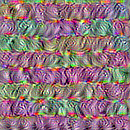

In [56]:
display(Image("0.png"))

Visualize the multiple filters in the target layer.

Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8


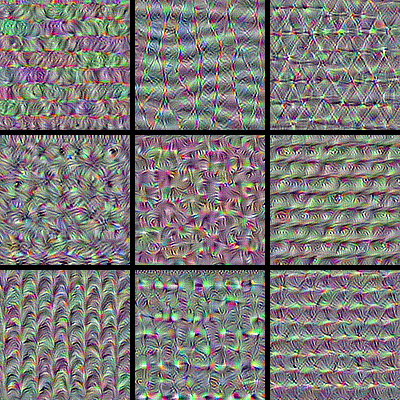

In [57]:
# Specify the number of filters to visualize
num_filters = 9

# Compute image inputs that maximize per-filter activations
all_imgs = []
for filter_index in range(num_filters):
    print("Processing filter %d" % (filter_index,))
    objective, img = visualize_filter(filter_index)
    all_imgs.append(img)

# Build a black picture with enough space for our filters
margin = 5
n = int(np.ceil(np.sqrt(num_filters)))
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))

# Fill the picture with our saved filters
for i in range(n):
    for j in range(n):
        if i * n + j < num_filters:
            img = all_imgs[i * n + j]
            stitched_filters[
                (cropped_width + margin) * i : (cropped_width + margin) * i + cropped_width,
                (cropped_height + margin) * j : (cropped_height + margin) * j + cropped_height,
                :,
            ] = img
keras.preprocessing.image.save_img("stitched_filters.png", stitched_filters)

from IPython.display import Image, display
display(Image("stitched_filters.png"))


Image classification models see the world by decomposing their inputs over a "vector basis" of texture filters such as these.

See also [this old blog post](https://blog.keras.io/how-convolutional-neural-networks-see-the-world.html) for analysis and interpretation.

## Just for Fun: Deep Dream

**["Deep dream"](https://keras.io/examples/generative/deep_dream/)** is an image-filtering technique which consists of taking an image classification model, and running gradient ascent over an input image to try to maximize the activations of specific layers (and sometimes, specific units in specific layers) for this input. It produces hallucination-like visuals.

It was first introduced by Alexander Mordvintsev from Google in July 2015.

Process:

- Load the original image.
- Define a number of processing scales ("octaves"), from smallest to largest.
- Resize the original image to the smallest scale.
- For every scale, starting with the smallest (i.e. current one): - Run gradient ascent - Upscale image to - the next scale - Reinject the detail that was lost at upscaling time
- Stop when we are back to the original size. To obtain the detail lost during upscaling, we simply take the original image, shrink it down, upscale it, and compare the result to the (resized) original image.

First, choose your 'base' image.

196111/196111 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


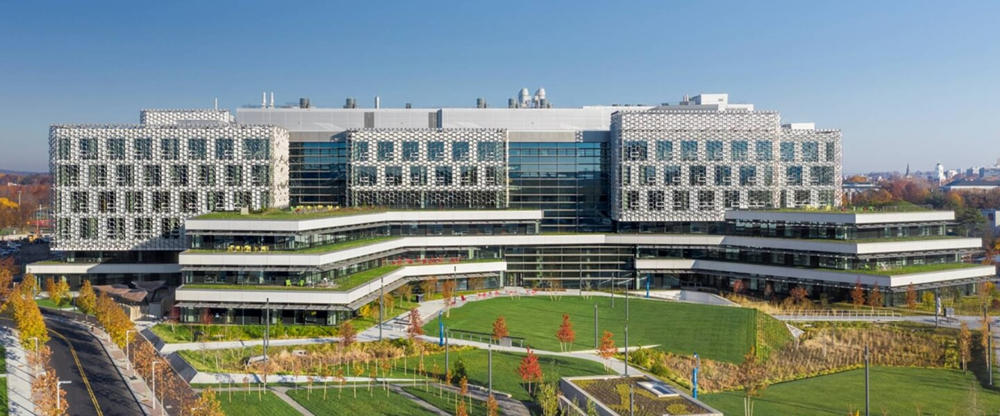

In [58]:
base_image_path = keras.utils.get_file(
    "SEC.jpg",
    "https://seas.harvard.edu/sites/default/files/styles/banner_large_wide_1x/public/2021-01/Tour_SEC%20copy.jpg?itok=Vk_2KyUg",
)
result_prefix = "dreamy_SEC"


display(Image(base_image_path))

We'll use the filters in the pre-trained Inception network to alter the image.

In [59]:
# Build an InceptionV3 model loaded with pre-trained ImageNet weights
model = keras.applications.inception_v3.InceptionV3(weights="imagenet", include_top=False)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Some steps need to be taken to preprocess an image for the inception network as well as 'deprocessing' it so we can display the results.

In [60]:
def preprocess_image(image_path):
    # Util function to open, resize and format pictures
    # into appropriate arrays.
    img = keras.preprocessing.image.load_img(image_path)
    img = keras.preprocessing.image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = keras.applications.inception_v3.preprocess_input(img)
    return img

def deprocess_image(x):
    # Util function to convert a NumPy array into a valid image.
    x = x.reshape((x.shape[1], x.shape[2], 3))
    # Undo inception v3 preprocessing
    x /= 2.0
    x += 0.5
    x *= 255.0
    # Convert to uint8 and clip to the valid range [0, 255]
    x = np.clip(x, 0, 255).astype("uint8")
    return x

Nex, we build a feature extraction model to retrieve the activations of our target layers given an input image.

In [61]:
# These are the names of the layers
# for which we try to maximize activation,
# as well as their weight in the final loss
# we try to maximize.
# You can tweak these setting to obtain new visual effects.
layer_settings = {
    "mixed4": 1.0,
    "mixed5": 1.5,
    "mixed6": 2.0,
    "mixed7": 2.5,
}

# Get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict(
    [
        (layer.name, layer.output)
        for layer in [model.get_layer(name) for name in layer_settings.keys()]
    ]
)

# Set up a model that returns the activation values for every target layer
# (as a dict)
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

In [62]:
def compute_objective(input_image):
    features = feature_extractor(input_image)
    # Initialize the loss
    objective = tf.zeros(shape=())
    for name in features.keys():
        coeff = layer_settings[name]
        activation = features[name]
        # We avoid border artifacts by only involving non-border pixels in the loss.
        scaling = tf.reduce_prod(tf.cast(tf.shape(activation), "float32"))
        objective += coeff * tf.reduce_sum(tf.square(activation[:, 2:-2, 2:-2, :])) / scaling
    return objective

The actual loss computation is very simple:

In [63]:
@tf.function
def gradient_ascent_step(img, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(img)
        objective = compute_objective(img)
    # Compute gradients.
    grads = tape.gradient(objective, img)
    # Normalize gradients.
    grads /= tf.maximum(tf.reduce_mean(tf.abs(grads)), 1e-6)
    img += learning_rate * grads
    return objective, img


def gradient_ascent_loop(img, iterations, learning_rate, max_objective=None):
    for i in range(iterations):
        objective, img = gradient_ascent_step(img, learning_rate)
        if max_objective is not None and objective > max_objective:
            break
        print("... Loss value at step %d: %.2f" % (i, objective))
    return img

Set up the gradient ascent loop for one octave

In [64]:
# Playing with these hyperparameters will also allow you to achieve new effects
step = 0.0125  # Gradient ascent step size
num_octave = 3  # Number of scales at which to run gradient ascent
octave_scale = 2  # Size ratio between scales
iterations = 200  # Number of ascent steps per scale
max_objective = 20.0

original_img = preprocess_image(base_image_path)
original_shape = original_img.shape[1:3]
successive_shapes = [original_shape]

for i in range(1, num_octave):
    shape = tuple([int(dim / (octave_scale ** i)) for dim in original_shape])
    successive_shapes.append(shape)
successive_shapes = successive_shapes[::-1]
shrunk_original_img = tf.image.resize(original_img, successive_shapes[0])

img = tf.identity(original_img)  # Make a copy
for i, shape in enumerate(successive_shapes):
    print("Processing octave %d with shape %s" % (i, shape))
    img = tf.image.resize(img, shape)
    img = gradient_ascent_loop(
        img, iterations=iterations, learning_rate=step, max_objective=max_objective
    )
    upscaled_shrunk_original_img = tf.image.resize(shrunk_original_img, shape)
    same_size_original = tf.image.resize(original_img, shape)
    objective_detail = same_size_original - upscaled_shrunk_original_img

    img += objective_detail
    shrunk_original_img = tf.image.resize(original_img, shape)

keras.preprocessing.image.save_img(result_prefix + ".png", deprocess_image(img.numpy()))

Processing octave 0 with shape (150, 360)


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_834']
Received: inputs=Tensor(shape=(1, 150, 360, 3))
  warnings.warn(msg)


... Loss value at step 0: 0.46
... Loss value at step 1: 0.60
... Loss value at step 2: 0.80
... Loss value at step 3: 0.97
... Loss value at step 4: 1.11
... Loss value at step 5: 1.27
... Loss value at step 6: 1.43
... Loss value at step 7: 1.56
... Loss value at step 8: 1.66
... Loss value at step 9: 1.82
... Loss value at step 10: 1.95
... Loss value at step 11: 2.04
... Loss value at step 12: 2.14
... Loss value at step 13: 2.26
... Loss value at step 14: 2.34
... Loss value at step 15: 2.45
... Loss value at step 16: 2.56
... Loss value at step 17: 2.64
... Loss value at step 18: 2.82
... Loss value at step 19: 2.90
... Loss value at step 20: 3.03
... Loss value at step 21: 3.11
... Loss value at step 22: 3.24
... Loss value at step 23: 3.22
... Loss value at step 24: 3.36
... Loss value at step 25: 3.42
... Loss value at step 26: 3.59
... Loss value at step 27: 3.62
... Loss value at step 28: 3.70
... Loss value at step 29: 3.88
... Loss value at step 30: 3.90
... Loss value at 

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_834']
Received: inputs=Tensor(shape=(1, 300, 720, 3))
  warnings.warn(msg)


... Loss value at step 0: 0.52
... Loss value at step 1: 0.74
... Loss value at step 2: 0.92
... Loss value at step 3: 1.07
... Loss value at step 4: 1.22
... Loss value at step 5: 1.38
... Loss value at step 6: 1.50
... Loss value at step 7: 1.65
... Loss value at step 8: 1.78
... Loss value at step 9: 1.90
... Loss value at step 10: 2.02
... Loss value at step 11: 2.14
... Loss value at step 12: 2.25
... Loss value at step 13: 2.35
... Loss value at step 14: 2.48
... Loss value at step 15: 2.58
... Loss value at step 16: 2.69
... Loss value at step 17: 2.81
... Loss value at step 18: 2.89
... Loss value at step 19: 3.01
... Loss value at step 20: 3.14
... Loss value at step 21: 3.27
... Loss value at step 22: 3.37
... Loss value at step 23: 3.44
... Loss value at step 24: 3.54
... Loss value at step 25: 3.61
... Loss value at step 26: 3.75
... Loss value at step 27: 3.90
... Loss value at step 28: 4.01
... Loss value at step 29: 4.08
... Loss value at step 30: 4.14
... Loss value at 

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_834']
Received: inputs=Tensor(shape=(1, 600, 1440, 3))
  warnings.warn(msg)


... Loss value at step 0: 0.60
... Loss value at step 1: 0.83
... Loss value at step 2: 1.04
... Loss value at step 3: 1.22
... Loss value at step 4: 1.38
... Loss value at step 5: 1.55
... Loss value at step 6: 1.71
... Loss value at step 7: 1.89
... Loss value at step 8: 2.07
... Loss value at step 9: 2.27
... Loss value at step 10: 2.43
... Loss value at step 11: 2.62
... Loss value at step 12: 2.80
... Loss value at step 13: 3.00
... Loss value at step 14: 3.17
... Loss value at step 15: 3.38
... Loss value at step 16: 3.58
... Loss value at step 17: 3.77
... Loss value at step 18: 3.95
... Loss value at step 19: 4.13
... Loss value at step 20: 4.33
... Loss value at step 21: 4.56
... Loss value at step 22: 4.75
... Loss value at step 23: 4.95
... Loss value at step 24: 5.21
... Loss value at step 25: 5.44
... Loss value at step 26: 5.65
... Loss value at step 27: 5.84
... Loss value at step 28: 6.04
... Loss value at step 29: 6.24
... Loss value at step 30: 6.55
... Loss value at 

Run the training loop, iterating over different octaves.

In [65]:
display(Image(result_prefix + ".png"))

Output hidden; open in https://colab.research.google.com to view.

Try your own input image and tweak the hyperparameters to see what bizarre images you can produce!

**The End**🌈